In [1]:
%load_ext autoreload
%autoreload 2

import torch
from torch.utils.data import TensorDataset
from torch.utils.data import DataLoader

import numpy as np
import scipy
from scipy.interpolate import RegularGridInterpolator

from tqdm import tqdm 

import os

import matplotlib.pyplot as plt
from neurorient import NeurOrient
from neurorient.utils_visualization import save_mrc, display_volumes, display_fsc, display_images
from neurorient.reconstruction.phasing import PhaseRetriever
from neurorient.metrics import compute_fsc
from neurorient.reconstruction.slicing import real_mesh_2_reciprocal_mesh

from sklearn.model_selection import train_test_split

import skopi as sk
import h5py
from pytorch3d.transforms import (
    matrix_to_quaternion, quaternion_to_matrix, so3_rotation_angle, so3_relative_angle,
    matrix_to_axis_angle
    )

device = 'cuda' if torch.cuda.is_available() else 'cpu'

/pscratch/sd/z/zhantao/conda/om/lib/python3.9/site-packages/skopi/diffraction.py:76: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def get_phase(atom_pos, q_xyz):
/pscratch/sd/z/zhantao/conda/om/lib/python3.9/site-packages/skopi/diffraction.py:90: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def cal(f_hkl, atom_pos, q_xyz, xyz_ind, pixel_number):
/pscratch/sd/z

In [2]:
pdb = '1BXR'
poisson = True
num_images = 10000
increase_factor = 10

In [3]:
spi_data = torch.load(f'/pscratch/sd/z/zhantao/neurorient_repo/data/{pdb}_increase{increase_factor:d}_poisson{poisson}_num{num_images//1000:d}K.pt')
# ckpt_path = '/pscratch/sd/z/zhantao/neurorient_repo/model/lightning_logs/version_15732777/checkpoints/last.ckpt'
ckpt_path = '/pscratch/sd/z/zhantao/neurorient_repo/model/lightning_logs/version_15735849/checkpoints/last.ckpt'
save_dir = '/pscratch/sd/z/zhantao/neurorient_repo/data'
print(spi_data.keys())

dict_keys(['orientations', 'intensities', 'pixel_position_reciprocal', 'pixel_index_map', 'volume', 'img_real_mesh', 'vol_real_mesh', 'time_stamp'])


In [4]:
model = NeurOrient.load_from_checkpoint(ckpt_path)

In [5]:
model.to(device)

grid_reciprocal = np.pi * model.grid_position_reciprocal / model.grid_position_reciprocal.max()
with torch.no_grad():
    intensity = model.predict_intensity(grid_reciprocal.to(device))
intensity_pred = (torch.exp(intensity) - 1).cpu().numpy() / model.loss_scale_factor

In [6]:
model.grid_position_reciprocal.shape

torch.Size([128, 128, 128, 3])

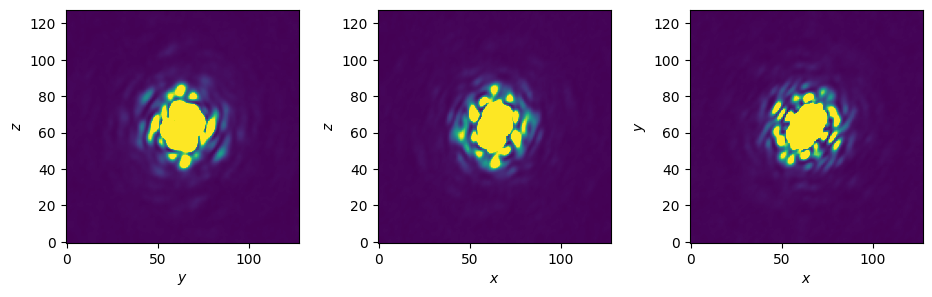

In [7]:
display_volumes(intensity_pred, closefig=False, vmin=0, vmax=1e-3 * intensity_pred.max())

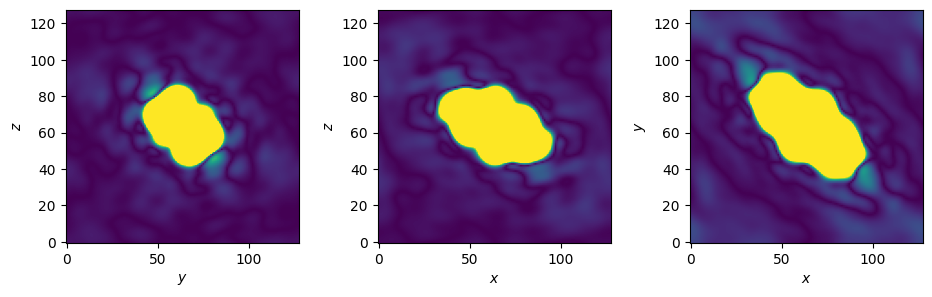

In [8]:
ac_pred = torch.fft.fftshift(torch.fft.ifftn(torch.fft.ifftshift(torch.from_numpy(intensity_pred))).abs())
display_volumes(ac_pred, closefig=False, vmin=0, vmax=1e-2 * ac_pred.max())

In [9]:
import numpy as np
import plotly.graph_objects as go

def visualize_slice(coordinates, image_slice):
    # Coordinates extraction
    x = coordinates[0].flatten()
    y = coordinates[1].flatten()
    z = coordinates[2].flatten()
    
    # Pixel values from image slice
    color = image_slice.flatten().clip(0., image_slice.max()*5e-3)
    
    # Create scatter plot
    scatter = go.Scatter3d(x=x, y=y, z=z, mode='markers',
                           marker=dict(size=2, color=color, colorscale='Viridis'))
    
    return scatter

In [10]:
from neurorient.reconstruction.slicing import gen_nonuniform_normalized_positions

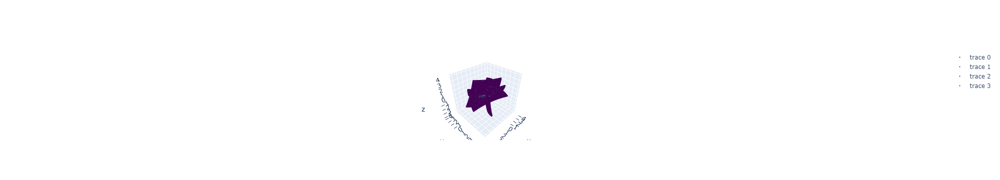

In [11]:
data_plotly = []
for i in range(4):
    images = spi_data['intensities'][i].numpy()
    coords = gen_nonuniform_normalized_positions(spi_data['orientations'][i:i+1], spi_data['pixel_position_reciprocal'], oversampling=1).numpy()
    data_plotly.append(visualize_slice(coords, images))

fig = go.Figure(data=data_plotly)
fig.show()

In [1]:
def visualize_volume_as_isosurface(x, y, z, volume, surface_count):
    # volume = volume.clip(0, 5e-3 * volume.max())
    # volume = volume / volume.max()
    # Create isosurface plot for the volume
    vol = go.Volume(
        x=x.flatten(),
        y=y.flatten(),
        z=z.flatten(),
        value=volume.flatten(),
        isomin=0.1,
        isomax=0.8,
        opacity=0.1, # needs to be small to see through all surfaces
        surface_count=17, # needs to be a large number for good volume rendering
    )

    fig = go.Figure(data=[vol])
    fig.show()


In [35]:
x, y, z = model.grid_position_reciprocal.permute(3,0,1,2).cpu().numpy()

In [42]:
X, Y, Z = np.mgrid[-8:8:40j, -8:8:40j, -8:8:40j]
values = np.sin(X*Y*Z) / (X*Y*Z)
visualize_volume_as_isosurface(X,Y,Z,values, 5)

ValueError: 
    Invalid element(s) received for the 'data' property of 
        Invalid elements include: [Figure({
    'data': [{'isomax': 0.8,
              'isomin': 0.1,
              'opacity': 0.1,
              'surface': {'count': 17},
              'type': 'volume',
              'value': array([0.00015531, 0.00192122, 0.00158326, ..., 0.00158326, 0.00192122,
                              0.00015531]),
              'x': array([[[-8.        , -8.        , -8.        , ..., -8.        ,
                            -8.        , -8.        ],
                           [-8.        , -8.        , -8.        , ..., -8.        ,
                            -8.        , -8.        ],
                           [-8.        , -8.        , -8.        , ..., -8.        ,
                            -8.        , -8.        ],
                           ...,
                           [-8.        , -8.        , -8.        , ..., -8.        ,
                            -8.        , -8.        ],
                           [-8.        , -8.        , -8.        , ..., -8.        ,
                            -8.        , -8.        ],
                           [-8.        , -8.        , -8.        , ..., -8.        ,
                            -8.        , -8.        ]],
                   
                          [[-7.58974359, -7.58974359, -7.58974359, ..., -7.58974359,
                            -7.58974359, -7.58974359],
                           [-7.58974359, -7.58974359, -7.58974359, ..., -7.58974359,
                            -7.58974359, -7.58974359],
                           [-7.58974359, -7.58974359, -7.58974359, ..., -7.58974359,
                            -7.58974359, -7.58974359],
                           ...,
                           [-7.58974359, -7.58974359, -7.58974359, ..., -7.58974359,
                            -7.58974359, -7.58974359],
                           [-7.58974359, -7.58974359, -7.58974359, ..., -7.58974359,
                            -7.58974359, -7.58974359],
                           [-7.58974359, -7.58974359, -7.58974359, ..., -7.58974359,
                            -7.58974359, -7.58974359]],
                   
                          [[-7.17948718, -7.17948718, -7.17948718, ..., -7.17948718,
                            -7.17948718, -7.17948718],
                           [-7.17948718, -7.17948718, -7.17948718, ..., -7.17948718,
                            -7.17948718, -7.17948718],
                           [-7.17948718, -7.17948718, -7.17948718, ..., -7.17948718,
                            -7.17948718, -7.17948718],
                           ...,
                           [-7.17948718, -7.17948718, -7.17948718, ..., -7.17948718,
                            -7.17948718, -7.17948718],
                           [-7.17948718, -7.17948718, -7.17948718, ..., -7.17948718,
                            -7.17948718, -7.17948718],
                           [-7.17948718, -7.17948718, -7.17948718, ..., -7.17948718,
                            -7.17948718, -7.17948718]],
                   
                          ...,
                   
                          [[ 7.17948718,  7.17948718,  7.17948718, ...,  7.17948718,
                             7.17948718,  7.17948718],
                           [ 7.17948718,  7.17948718,  7.17948718, ...,  7.17948718,
                             7.17948718,  7.17948718],
                           [ 7.17948718,  7.17948718,  7.17948718, ...,  7.17948718,
                             7.17948718,  7.17948718],
                           ...,
                           [ 7.17948718,  7.17948718,  7.17948718, ...,  7.17948718,
                             7.17948718,  7.17948718],
                           [ 7.17948718,  7.17948718,  7.17948718, ...,  7.17948718,
                             7.17948718,  7.17948718],
                           [ 7.17948718,  7.17948718,  7.17948718, ...,  7.17948718,
                             7.17948718,  7.17948718]],
                   
                          [[ 7.58974359,  7.58974359,  7.58974359, ...,  7.58974359,
                             7.58974359,  7.58974359],
                           [ 7.58974359,  7.58974359,  7.58974359, ...,  7.58974359,
                             7.58974359,  7.58974359],
                           [ 7.58974359,  7.58974359,  7.58974359, ...,  7.58974359,
                             7.58974359,  7.58974359],
                           ...,
                           [ 7.58974359,  7.58974359,  7.58974359, ...,  7.58974359,
                             7.58974359,  7.58974359],
                           [ 7.58974359,  7.58974359,  7.58974359, ...,  7.58974359,
                             7.58974359,  7.58974359],
                           [ 7.58974359,  7.58974359,  7.58974359, ...,  7.58974359,
                             7.58974359,  7.58974359]],
                   
                          [[ 8.        ,  8.        ,  8.        , ...,  8.        ,
                             8.        ,  8.        ],
                           [ 8.        ,  8.        ,  8.        , ...,  8.        ,
                             8.        ,  8.        ],
                           [ 8.        ,  8.        ,  8.        , ...,  8.        ,
                             8.        ,  8.        ],
                           ...,
                           [ 8.        ,  8.        ,  8.        , ...,  8.        ,
                             8.        ,  8.        ],
                           [ 8.        ,  8.        ,  8.        , ...,  8.        ,
                             8.        ,  8.        ],
                           [ 8.        ,  8.        ,  8.        , ...,  8.        ,
                             8.        ,  8.        ]]]),
              'y': array([[[-8.        , -8.        , -8.        , ..., -8.        ,
                            -8.        , -8.        ],
                           [-7.58974359, -7.58974359, -7.58974359, ..., -7.58974359,
                            -7.58974359, -7.58974359],
                           [-7.17948718, -7.17948718, -7.17948718, ..., -7.17948718,
                            -7.17948718, -7.17948718],
                           ...,
                           [ 7.17948718,  7.17948718,  7.17948718, ...,  7.17948718,
                             7.17948718,  7.17948718],
                           [ 7.58974359,  7.58974359,  7.58974359, ...,  7.58974359,
                             7.58974359,  7.58974359],
                           [ 8.        ,  8.        ,  8.        , ...,  8.        ,
                             8.        ,  8.        ]],
                   
                          [[-8.        , -8.        , -8.        , ..., -8.        ,
                            -8.        , -8.        ],
                           [-7.58974359, -7.58974359, -7.58974359, ..., -7.58974359,
                            -7.58974359, -7.58974359],
                           [-7.17948718, -7.17948718, -7.17948718, ..., -7.17948718,
                            -7.17948718, -7.17948718],
                           ...,
                           [ 7.17948718,  7.17948718,  7.17948718, ...,  7.17948718,
                             7.17948718,  7.17948718],
                           [ 7.58974359,  7.58974359,  7.58974359, ...,  7.58974359,
                             7.58974359,  7.58974359],
                           [ 8.        ,  8.        ,  8.        , ...,  8.        ,
                             8.        ,  8.        ]],
                   
                          [[-8.        , -8.        , -8.        , ..., -8.        ,
                            -8.        , -8.        ],
                           [-7.58974359, -7.58974359, -7.58974359, ..., -7.58974359,
                            -7.58974359, -7.58974359],
                           [-7.17948718, -7.17948718, -7.17948718, ..., -7.17948718,
                            -7.17948718, -7.17948718],
                           ...,
                           [ 7.17948718,  7.17948718,  7.17948718, ...,  7.17948718,
                             7.17948718,  7.17948718],
                           [ 7.58974359,  7.58974359,  7.58974359, ...,  7.58974359,
                             7.58974359,  7.58974359],
                           [ 8.        ,  8.        ,  8.        , ...,  8.        ,
                             8.        ,  8.        ]],
                   
                          ...,
                   
                          [[-8.        , -8.        , -8.        , ..., -8.        ,
                            -8.        , -8.        ],
                           [-7.58974359, -7.58974359, -7.58974359, ..., -7.58974359,
                            -7.58974359, -7.58974359],
                           [-7.17948718, -7.17948718, -7.17948718, ..., -7.17948718,
                            -7.17948718, -7.17948718],
                           ...,
                           [ 7.17948718,  7.17948718,  7.17948718, ...,  7.17948718,
                             7.17948718,  7.17948718],
                           [ 7.58974359,  7.58974359,  7.58974359, ...,  7.58974359,
                             7.58974359,  7.58974359],
                           [ 8.        ,  8.        ,  8.        , ...,  8.        ,
                             8.        ,  8.        ]],
                   
                          [[-8.        , -8.        , -8.        , ..., -8.        ,
                            -8.        , -8.        ],
                           [-7.58974359, -7.58974359, -7.58974359, ..., -7.58974359,
                            -7.58974359, -7.58974359],
                           [-7.17948718, -7.17948718, -7.17948718, ..., -7.17948718,
                            -7.17948718, -7.17948718],
                           ...,
                           [ 7.17948718,  7.17948718,  7.17948718, ...,  7.17948718,
                             7.17948718,  7.17948718],
                           [ 7.58974359,  7.58974359,  7.58974359, ...,  7.58974359,
                             7.58974359,  7.58974359],
                           [ 8.        ,  8.        ,  8.        , ...,  8.        ,
                             8.        ,  8.        ]],
                   
                          [[-8.        , -8.        , -8.        , ..., -8.        ,
                            -8.        , -8.        ],
                           [-7.58974359, -7.58974359, -7.58974359, ..., -7.58974359,
                            -7.58974359, -7.58974359],
                           [-7.17948718, -7.17948718, -7.17948718, ..., -7.17948718,
                            -7.17948718, -7.17948718],
                           ...,
                           [ 7.17948718,  7.17948718,  7.17948718, ...,  7.17948718,
                             7.17948718,  7.17948718],
                           [ 7.58974359,  7.58974359,  7.58974359, ...,  7.58974359,
                             7.58974359,  7.58974359],
                           [ 8.        ,  8.        ,  8.        , ...,  8.        ,
                             8.        ,  8.        ]]]),
              'z': array([[[-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           ...,
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ]],
                   
                          [[-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           ...,
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ]],
                   
                          [[-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           ...,
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ]],
                   
                          ...,
                   
                          [[-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           ...,
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ]],
                   
                          [[-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           ...,
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ]],
                   
                          [[-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           ...,
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ],
                           [-8.        , -7.58974359, -7.17948718, ...,  7.17948718,
                             7.58974359,  8.        ]]])}],
    'layout': {'template': '...'}
})]

    The 'data' property is a tuple of trace instances
    that may be specified as:
      - A list or tuple of trace instances
        (e.g. [Scatter(...), Bar(...)])
      - A single trace instance
        (e.g. Scatter(...), Bar(...), etc.)
      - A list or tuple of dicts of string/value properties where:
        - The 'type' property specifies the trace type
            One of: ['bar', 'barpolar', 'box', 'candlestick',
                     'carpet', 'choropleth', 'choroplethmapbox',
                     'cone', 'contour', 'contourcarpet',
                     'densitymapbox', 'funnel', 'funnelarea',
                     'heatmap', 'heatmapgl', 'histogram',
                     'histogram2d', 'histogram2dcontour', 'icicle',
                     'image', 'indicator', 'isosurface', 'mesh3d',
                     'ohlc', 'parcats', 'parcoords', 'pie',
                     'pointcloud', 'sankey', 'scatter',
                     'scatter3d', 'scattercarpet', 'scattergeo',
                     'scattergl', 'scattermapbox', 'scatterpolar',
                     'scatterpolargl', 'scattersmith',
                     'scatterternary', 'splom', 'streamtube',
                     'sunburst', 'surface', 'table', 'treemap',
                     'violin', 'volume', 'waterfall']

        - All remaining properties are passed to the constructor of
          the specified trace type

        (e.g. [{'type': 'scatter', ...}, {'type': 'bar, ...}])

In [37]:
visualize_volume_as_isosurface(x,y,z,intensity_pred, 5)

ValueError: 
    Invalid element(s) received for the 'data' property of 
        Invalid elements include: [Figure({
    'data': [{'isomax': 0.8,
              'isomin': 0.1,
              'opacity': 0.1,
              'surface': {'count': 17},
              'type': 'volume',
              'value': array([0.        , 0.00025346, 0.00039578, ..., 0.00039579, 0.00025346,
                              0.        ], dtype=float32),
              'x': array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,  11.,
                           12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,  22.,  23.,
                           24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,  33.,  34.,  35.,
                           36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,  44.,  45.,  46.,  47.,
                           48.,  49.,  50.,  51.,  52.,  53.,  54.,  55.,  56.,  57.,  58.,  59.,
                           60.,  61.,  62.,  63.,  64.,  65.,  66.,  67.,  68.,  69.,  70.,  71.,
                           72.,  73.,  74.,  75.,  76.,  77.,  78.,  79.,  80.,  81.,  82.,  83.,
                           84.,  85.,  86.,  87.,  88.,  89.,  90.,  91.,  92.,  93.,  94.,  95.,
                           96.,  97.,  98.,  99., 100., 101., 102., 103., 104., 105., 106., 107.,
                          108., 109., 110., 111., 112., 113., 114., 115., 116., 117., 118., 119.,
                          120., 121., 122., 123., 124., 125., 126., 127.]),
              'y': array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,  11.,
                           12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,  22.,  23.,
                           24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,  33.,  34.,  35.,
                           36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,  44.,  45.,  46.,  47.,
                           48.,  49.,  50.,  51.,  52.,  53.,  54.,  55.,  56.,  57.,  58.,  59.,
                           60.,  61.,  62.,  63.,  64.,  65.,  66.,  67.,  68.,  69.,  70.,  71.,
                           72.,  73.,  74.,  75.,  76.,  77.,  78.,  79.,  80.,  81.,  82.,  83.,
                           84.,  85.,  86.,  87.,  88.,  89.,  90.,  91.,  92.,  93.,  94.,  95.,
                           96.,  97.,  98.,  99., 100., 101., 102., 103., 104., 105., 106., 107.,
                          108., 109., 110., 111., 112., 113., 114., 115., 116., 117., 118., 119.,
                          120., 121., 122., 123., 124., 125., 126., 127.]),
              'z': array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,  11.,
                           12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,  22.,  23.,
                           24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,  33.,  34.,  35.,
                           36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,  44.,  45.,  46.,  47.,
                           48.,  49.,  50.,  51.,  52.,  53.,  54.,  55.,  56.,  57.,  58.,  59.,
                           60.,  61.,  62.,  63.,  64.,  65.,  66.,  67.,  68.,  69.,  70.,  71.,
                           72.,  73.,  74.,  75.,  76.,  77.,  78.,  79.,  80.,  81.,  82.,  83.,
                           84.,  85.,  86.,  87.,  88.,  89.,  90.,  91.,  92.,  93.,  94.,  95.,
                           96.,  97.,  98.,  99., 100., 101., 102., 103., 104., 105., 106., 107.,
                          108., 109., 110., 111., 112., 113., 114., 115., 116., 117., 118., 119.,
                          120., 121., 122., 123., 124., 125., 126., 127.])}],
    'layout': {'template': '...'}
})]

    The 'data' property is a tuple of trace instances
    that may be specified as:
      - A list or tuple of trace instances
        (e.g. [Scatter(...), Bar(...)])
      - A single trace instance
        (e.g. Scatter(...), Bar(...), etc.)
      - A list or tuple of dicts of string/value properties where:
        - The 'type' property specifies the trace type
            One of: ['bar', 'barpolar', 'box', 'candlestick',
                     'carpet', 'choropleth', 'choroplethmapbox',
                     'cone', 'contour', 'contourcarpet',
                     'densitymapbox', 'funnel', 'funnelarea',
                     'heatmap', 'heatmapgl', 'histogram',
                     'histogram2d', 'histogram2dcontour', 'icicle',
                     'image', 'indicator', 'isosurface', 'mesh3d',
                     'ohlc', 'parcats', 'parcoords', 'pie',
                     'pointcloud', 'sankey', 'scatter',
                     'scatter3d', 'scattercarpet', 'scattergeo',
                     'scattergl', 'scattermapbox', 'scatterpolar',
                     'scatterpolargl', 'scattersmith',
                     'scatterternary', 'splom', 'streamtube',
                     'sunburst', 'surface', 'table', 'treemap',
                     'violin', 'volume', 'waterfall']

        - All remaining properties are passed to the constructor of
          the specified trace type

        (e.g. [{'type': 'scatter', ...}, {'type': 'bar, ...}])